<a href="https://colab.research.google.com/github/TANUGEHU/bigint/blob/main/music_genre_classification.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import librosa
import pandas as pd
import csv
import os
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sn
import librosa.display

## **Creating Dataset**

In [ ]:
header = 'filename chroma_stft rmse spectral_centroid spectral_bandwidth rolloff zero_crossing_rate tempo flux contrast flatness'
for i in range(1, 21):
    header += f' mfcc{i}'
header += ' label'
header = header.split()
file = open('music_data.csv', 'w', newline='')
with file:
    writer = csv.writer(file)
    writer.writerow(header)
genres = 'blues classical country disco hiphop jazz metal pop reggae rock'.split()
for g in genres:
    for filename in os.listdir('/content/drive/MyDrive/Colab Notebooks/data_wav/'+g):
        songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ g + '/' + filename
        y, sr = librosa.load(songname, mono=True, duration=30)# convert to mono audio and truncates the file to 30 seconds to standardize the input length for processing.
        chroma_stft = librosa.feature.chroma_stft(y=y, sr=sr)
        spec_cent = librosa.feature.spectral_centroid(y=y, sr=sr)
        spec_bw = librosa.feature.spectral_bandwidth(y=y, sr=sr)
        rolloff = librosa.feature.spectral_rolloff(y=y, sr=sr)
        zcr = librosa.feature.zero_crossing_rate(y)
        mfcc = librosa.feature.mfcc(y=y, sr=sr)
        rmse = librosa.feature.rms(y=y)

        tempo = librosa.beat.tempo(y=y, sr=sr)[0]

        flux = librosa.onset.onset_strength(y=y, sr=sr)
        contrast = librosa.feature.spectral_contrast(y=y, sr=sr)
        flatness = librosa.feature.spectral_flatness(y=y)

        to_append = f'{filename} {np.mean(chroma_stft)} {np.mean(rmse)} {np.mean(spec_cent)} {np.mean(spec_bw)} {np.mean(rolloff)} {np.mean(zcr)} {np.mean(tempo)} {np.mean(flux)} {np.mean(contrast)} {np.mean(flatness)}'
        for e in mfcc:
            to_append += f' {np.mean(e)}'
        to_append += f' {g}'
        file = open('music_data.csv', 'a', newline='')
        with file:
            writer = csv.writer(file)
            writer.writerow(to_append.split())

<ipython-input-4-a8c3a8d36e69>:23: FutureWarning: librosa.beat.tempo
	This function was moved to 'librosa.feature.rhythm.tempo' in librosa version 0.10.0.
	This alias will be removed in librosa version 1.0.
  tempo = librosa.beat.tempo(y=y, sr=sr)[0]


In [ ]:
df =pd.read_csv('/content/drive/MyDrive/Colab Notebooks/music_data.csv')
df.head()

,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,tempo,flux,contrast,...,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label
0,95.wav,0.322687,0.106126,2159.548320,2130.349345,4685.038337,0.098349,143.554688,1.675650,22.629318,...,6.793743,-11.729828,4.400940,-6.044507,1.966284,-12.326304,3.255044,-8.811428,-3.375358,blues
1,98.wav,0.253638,0.151532,1331.036591,1973.648646,2900.174130,0.042967,151.999081,1.347931,27.927204,...,-13.045100,-12.654766,-1.824344,-7.258695,-6.661086,-14.686605,-11.720062,-11.023768,-13.388401,blues
2,97.wav,0.377736,0.065891,570.150688,995.093473,928.852717,0.021701,143.554688,0.813417,21.405047,...,1.810350,-5.970981,-5.258748,-0.228882,-1.775328,-3.708839,0.175169,2.076678,-2.892004,blues
3,93.wav,0.270347,0.080639,1420.411479,1730.917102,2930.240615,0.063718,99.384014,1.460053,21.364321,...,-1.390677,0.014792,3.580495,-4.504993,-5.541952,-6.883078,-4.826390,1.738583,-1.884017,blues
4,94.wav,0.390160,0.136178,2279.265543,2375.084795,5198.476899,0.092570,135.999178,1.324151,21.730344,...,11.086617,-5.094468,3.978772,-12.864777,12.342427,0.020586,-0.739238,-5.130451,3.307131,blues


## **Understanding Data**

In [ ]:
df.describe()

,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,tempo,flux,contrast,flatness,...,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20
count,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000,...,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000,997.000000
mean,0.378903,0.131021,2204.062781,2244.253021,4576.752745,0.103748,121.044342,1.418038,20.517835,0.021624,...,-6.024816,4.489124,-4.809756,1.788299,-3.877850,1.156144,-3.981725,0.516131,-2.330576,-1.082593
std,0.081725,0.065675,715.820613,526.227472,1574.339116,0.041838,20.851096,0.340836,2.182129,0.028909,...,6.825312,6.719857,6.173622,5.016105,4.880067,4.583474,4.550680,3.869769,3.761036,3.835821
min,0.171770,0.005270,570.150688,899.979779,749.528801,0.021701,69.837416,0.608903,13.494408,0.000092,...,-28.050291,-15.806172,-27.549044,-12.605565,-17.545372,-15.697483,-17.235107,-11.985029,-18.505476,-19.933723
25%,0.319726,0.086962,1629.473423,1909.634591,3405.412741,0.070323,103.359375,1.162162,18.785296,0.003161,...,-10.970767,-0.516818,-9.372978,-1.650883,-7.185385,-1.823721,-7.204545,-1.998533,-4.684766,-3.343280
50%,0.383478,0.122564,2213.669961,2225.151545,4663.513467,0.099657,117.453835,1.364851,20.589887,0.010029,...,-5.929299,3.909562,-4.222730,1.884224,-3.638986,1.236277,-4.085201,0.682856,-2.393689,-1.133074
75%,0.435902,0.175800,2694.975720,2579.825496,5535.341529,0.132433,135.999178,1.633848,21.957340,0.031043,...,-0.977552,9.716908,-0.157817,5.196832,-0.317054,4.355795,-0.865488,3.117481,0.159331,1.317023
max,0.663541,0.397851,4434.948743,3509.582338,8676.447535,0.274829,184.570312,2.450920,27.927204,0.417921,...,17.423235,23.026806,13.060922,18.160437,12.356574,13.479482,11.479181,15.386705,14.691521,15.362202


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 997 entries, 0 to 996
Data columns (total 32 columns):
 #   Column              Non-Null Count  Dtype  
---  ------              --------------  -----  
 0   filename            997 non-null    object 
 1   chroma_stft         997 non-null    float64
 2   rmse                997 non-null    float64
 3   spectral_centroid   997 non-null    float64
 4   spectral_bandwidth  997 non-null    float64
 5   rolloff             997 non-null    float64
 6   zero_crossing_rate  997 non-null    float64
 7   tempo               997 non-null    float64
 8   flux                997 non-null    float64
 9   contrast            997 non-null    float64
 10  flatness            997 non-null    float64
 11  mfcc1               997 non-null    float64
 12  mfcc2               997 non-null    float64
 13  mfcc3               997 non-null    float64
 14  mfcc4               997 non-null    float64
 15  mfcc5               997 non-null    float64
 16  mfcc6   

In [ ]:
df.isnull().sum()

,0
filename,0
chroma_stft,0
rmse,0
spectral_centroid,0
spectral_bandwidth,0
rolloff,0
zero_crossing_rate,0
tempo,0
flux,0
contrast,0


In [ ]:
df['label'].unique()

array(['blues', 'classical', 'country', 'disco', 'hiphop', 'jazz',
       'metal', 'pop', 'reggae', 'rock'], dtype=object)

In [ ]:
df['label']=df['label'].astype('category')
df['class_label']=df['label'].cat.codes
pd.unique(df.loc[:,'label':'class_label'].values.ravel())

array(['blues', 0, 'classical', 1, 'country', 2, 'disco', 3, 'hiphop', 4,
       'jazz', 5, 'metal', 6, 'pop', 7, 'reggae', 8, 'rock', 9],
      dtype=object)

In [ ]:
df.columns

Index(['filename', 'chroma_stft', 'rmse', 'spectral_centroid',
       'spectral_bandwidth', 'rolloff', 'zero_crossing_rate', 'tempo', 'flux',
       'contrast', 'flatness', 'mfcc1', 'mfcc2', 'mfcc3', 'mfcc4', 'mfcc5',
       'mfcc6', 'mfcc7', 'mfcc8', 'mfcc9', 'mfcc10', 'mfcc11', 'mfcc12',
       'mfcc13', 'mfcc14', 'mfcc15', 'mfcc16', 'mfcc17', 'mfcc18', 'mfcc19',
       'mfcc20', 'label', 'class_label'],
      dtype='object')

## **Graph and Visualisation**

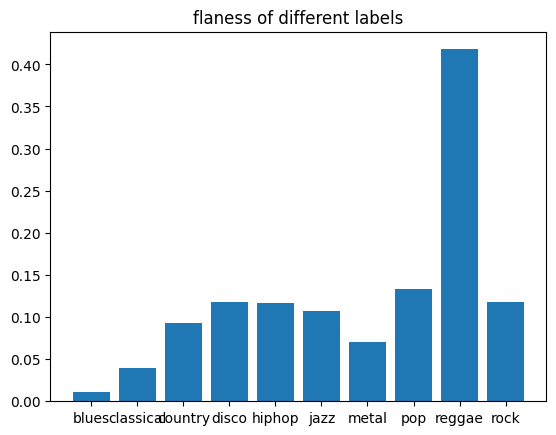

In [ ]:
import matplotlib.pyplot as plt
plt.bar(df['label'],df['flatness'])
#the more is the flatness the lower is the pitch
plt.title('flaness of different labels')
plt.show()

<ipython-input-10-32a90a650730>:4: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');


Text(0, 0.5, 'BPM')

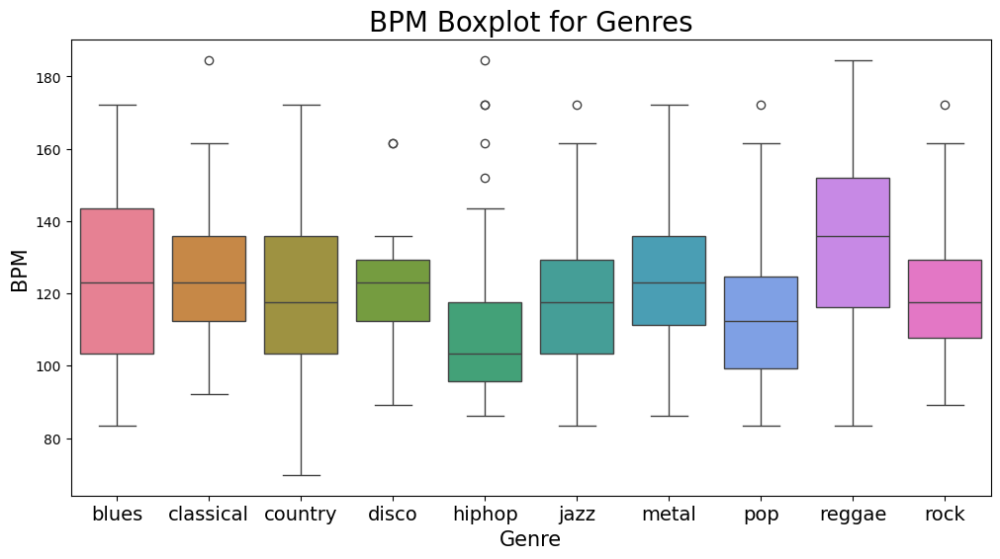

In [ ]:
import seaborn as sns
x = df[["label", "tempo"]]
fig, ax = plt.subplots(figsize=(12, 6));
sns.boxplot(x = "label", y = "tempo", data = x, palette = 'husl');
plt.title('BPM Boxplot for Genres', fontsize = 20)
plt.xticks(fontsize = 14)
plt.yticks(fontsize = 10);
x = df[["label", "tempo"]]
plt.xlabel("Genre", fontsize = 15)
plt.ylabel("BPM", fontsize = 15)

In [ ]:
def cap_outliers(df, column):
    Q1 = df[column].quantile(0.25)  # First quartile
    Q3 = df[column].quantile(0.75)  # Third quartile
    IQR = Q3 - Q1
    lower_bound = Q1 - 1.5 * IQR  # Lower bound
    upper_bound = Q3 + 1.5 * IQR  # Upper bound

    # Cap values below the lower bound
    df[column] = df[column].apply(lambda x: lower_bound if x < lower_bound else x)
    # Cap values above the upper bound
    df[column] = df[column].apply(lambda x: upper_bound if x > upper_bound else x)

    return df

<ipython-input-12-ae0b942a8a24>:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_capped = df.groupby("label", group_keys=False).apply(cap_outliers, column="tempo")
<ipython-input-12-ae0b942a8a24>:2: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  df_capped = df.groupby("label", group_keys=False).apply(cap_outliers, column="tempo")
<ipython-input-12-ae0b942a8a24>:5: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and se

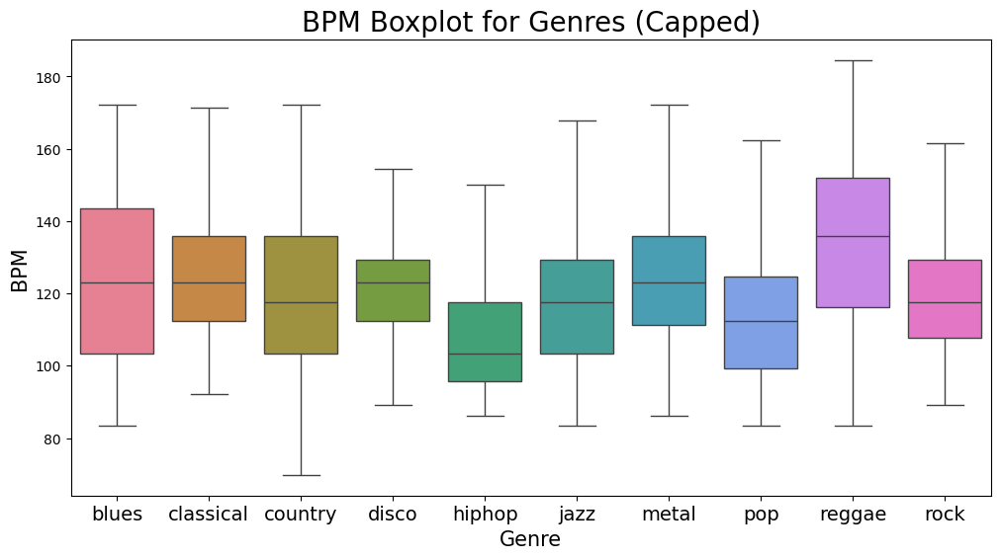

In [ ]:
# Apply capping to each genre
df_capped = df.groupby("label", group_keys=False).apply(cap_outliers, column="tempo")

fig, ax = plt.subplots(figsize=(12, 6))
sn.boxplot(x="label", y="tempo", data=df_capped, palette='husl', ax=ax)
plt.title('BPM Boxplot for Genres (Capped)', fontsize=20)
plt.xlabel("Genre", fontsize=15)
plt.ylabel("BPM", fontsize=15)
plt.xticks(fontsize=14)
plt.yticks(fontsize=10)
plt.show()


# **Spectrogram**

Blues


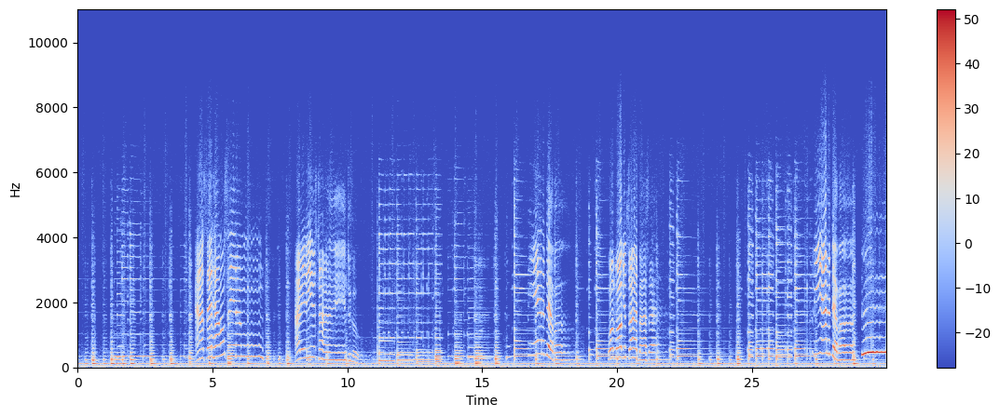

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "blues" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("Blues")

clssical


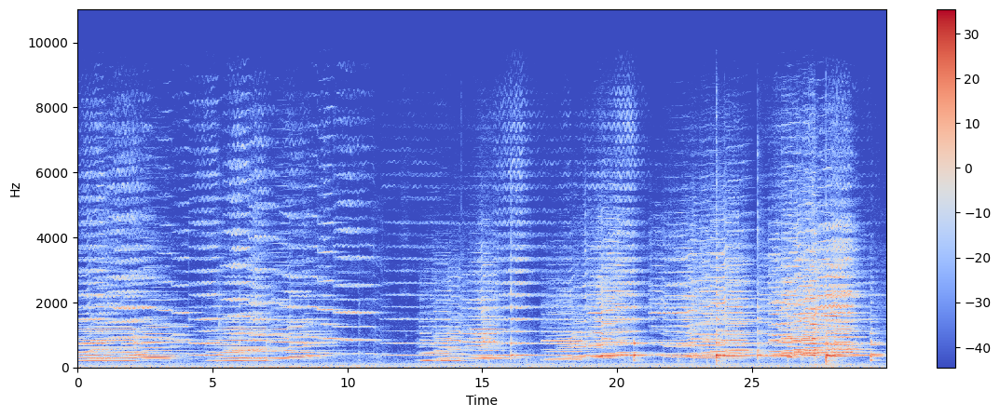

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "classical" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("clssical")

country


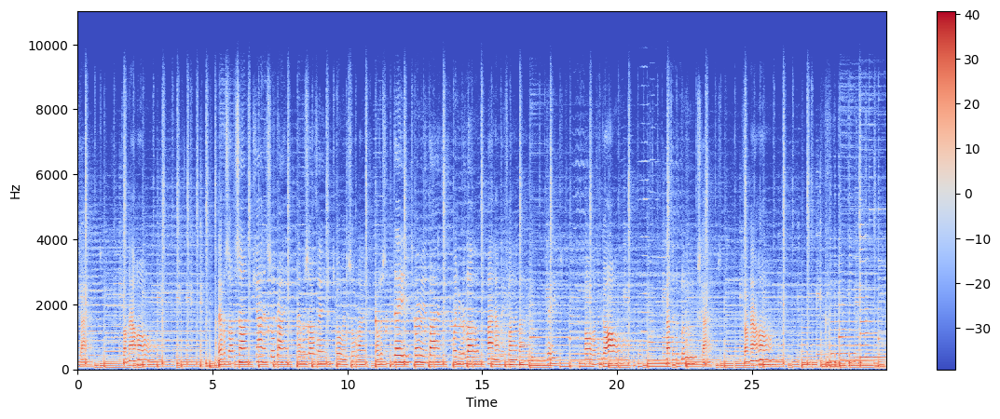

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "country" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("country")

disco


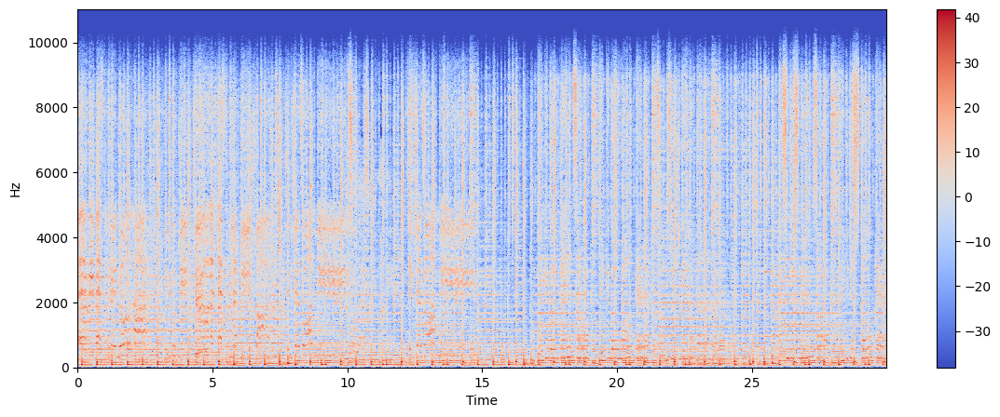

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "disco" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("disco")

hiphop


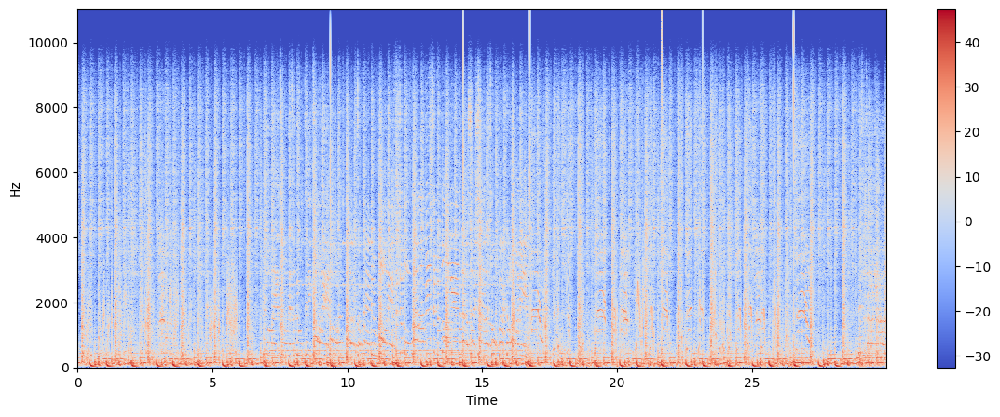

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "hiphop" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("hiphop")

jazz


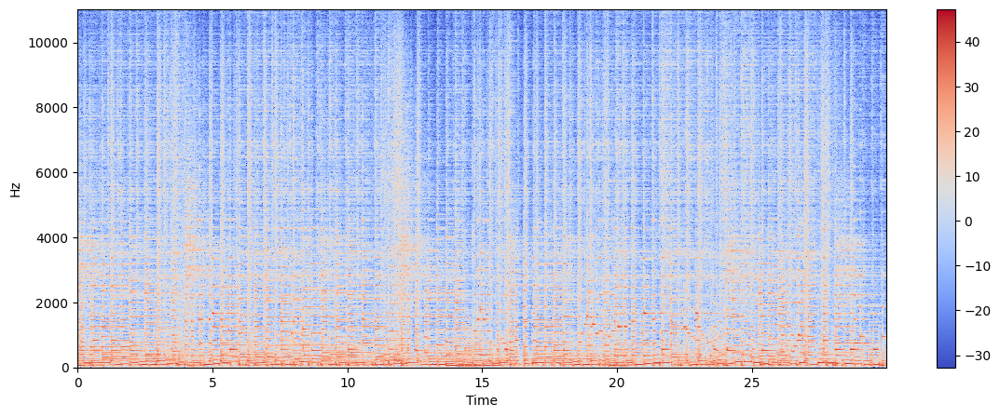

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "jazz" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("jazz")

metal


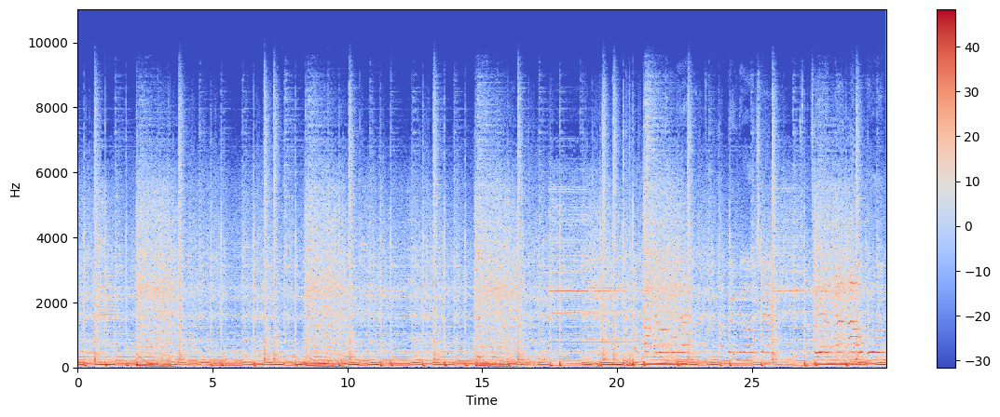

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "metal" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("metal")

pop


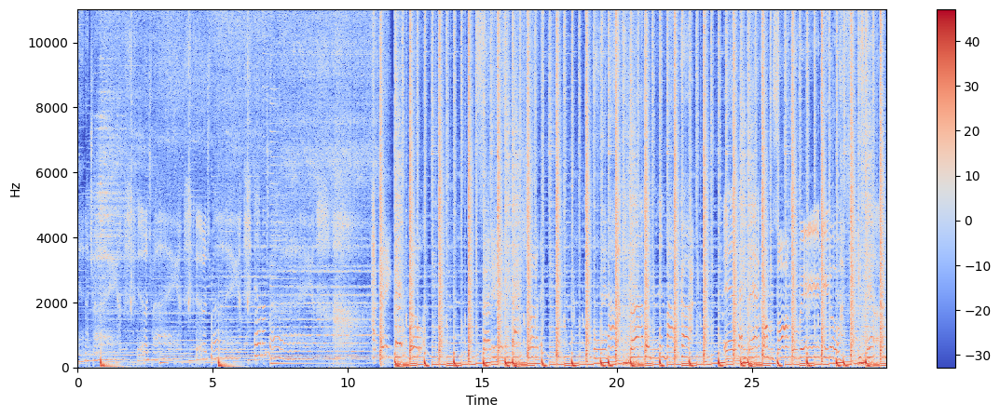

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "pop" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("pop")

reggae


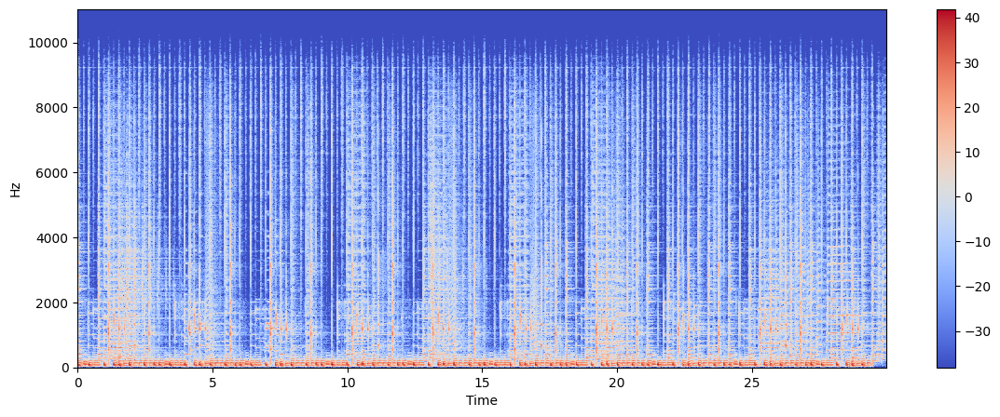

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "reggae" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("reggae")

rock


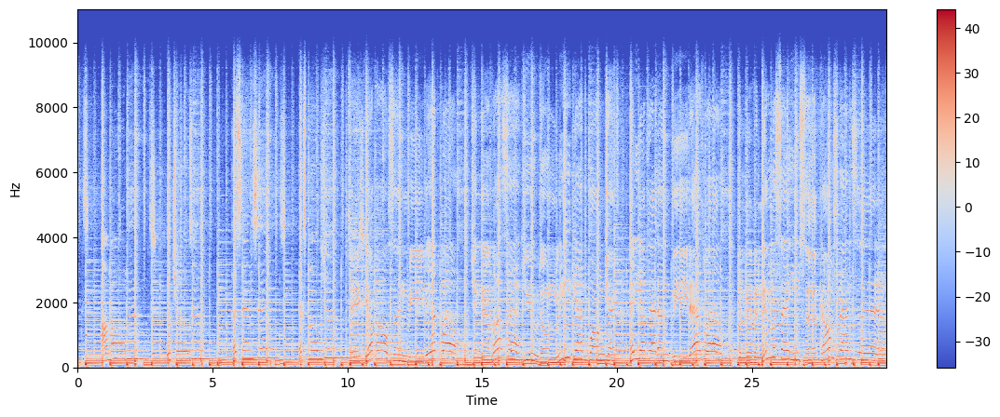

In [ ]:
  songname = '/content/drive/MyDrive/Colab Notebooks/data_wav/'+ "rock" + '/' + "0.wav"
  y, sr = librosa.load(songname, mono=True, duration=30)
  X = librosa.stft(y)
  Xdb = librosa.amplitude_to_db(abs(X))
  plt.figure(figsize=(14, 5))
  librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='hz')
  plt.colorbar()
  print("rock")

## **Dividing the dataset for Training and Testing**

In [ ]:
df_capped.head()

,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,tempo,flux,contrast,...,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label,class_label
0,95.wav,0.322687,0.106126,2159.548320,2130.349345,4685.038337,0.098349,143.554688,1.675650,22.629318,...,-11.729828,4.400940,-6.044507,1.966284,-12.326304,3.255044,-8.811428,-3.375358,blues,0
1,98.wav,0.253638,0.151532,1331.036591,1973.648646,2900.174130,0.042967,151.999081,1.347931,27.927204,...,-12.654766,-1.824344,-7.258695,-6.661086,-14.686605,-11.720062,-11.023768,-13.388401,blues,0
2,97.wav,0.377736,0.065891,570.150688,995.093473,928.852717,0.021701,143.554688,0.813417,21.405047,...,-5.970981,-5.258748,-0.228882,-1.775328,-3.708839,0.175169,2.076678,-2.892004,blues,0
3,93.wav,0.270347,0.080639,1420.411479,1730.917102,2930.240615,0.063718,99.384014,1.460053,21.364321,...,0.014792,3.580495,-4.504993,-5.541952,-6.883078,-4.826390,1.738583,-1.884017,blues,0
4,94.wav,0.390160,0.136178,2279.265543,2375.084795,5198.476899,0.092570,135.999178,1.324151,21.730344,...,-5.094468,3.978772,-12.864777,12.342427,0.020586,-0.739238,-5.130451,3.307131,blues,0


In [ ]:
df_new = df_capped.drop(columns=['label'])

In [ ]:
df_new.head()

,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,tempo,flux,contrast,...,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,class_label
0,95.wav,0.322687,0.106126,2159.548320,2130.349345,4685.038337,0.098349,143.554688,1.675650,22.629318,...,6.793743,-11.729828,4.400940,-6.044507,1.966284,-12.326304,3.255044,-8.811428,-3.375358,0
1,98.wav,0.253638,0.151532,1331.036591,1973.648646,2900.174130,0.042967,151.999081,1.347931,27.927204,...,-13.045100,-12.654766,-1.824344,-7.258695,-6.661086,-14.686605,-11.720062,-11.023768,-13.388401,0
2,97.wav,0.377736,0.065891,570.150688,995.093473,928.852717,0.021701,143.554688,0.813417,21.405047,...,1.810350,-5.970981,-5.258748,-0.228882,-1.775328,-3.708839,0.175169,2.076678,-2.892004,0
3,93.wav,0.270347,0.080639,1420.411479,1730.917102,2930.240615,0.063718,99.384014,1.460053,21.364321,...,-1.390677,0.014792,3.580495,-4.504993,-5.541952,-6.883078,-4.826390,1.738583,-1.884017,0
4,94.wav,0.390160,0.136178,2279.265543,2375.084795,5198.476899,0.092570,135.999178,1.324151,21.730344,...,11.086617,-5.094468,3.978772,-12.864777,12.342427,0.020586,-0.739238,-5.130451,3.307131,0


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.metrics import accuracy_score, confusion_matrix
genre_list = ["Blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"]
scaler = StandardScaler()
X = scaler.fit_transform(np.array(df_new.iloc[:,1:-1], dtype = float))
genre_list =df_new.iloc[:, -1]
encoder = LabelEncoder()
y = encoder.fit_transform(genre_list)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.30, random_state=42)

knn

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
model = KNeighborsClassifier(n_neighbors=3)
model.fit(X_train, y_train)
train_accuracy = model.score(X_train, y_train)
test_accuracy = model.score(X_test, y_test)
print("Train set accuracy: {:.2f}".format(train_accuracy))
print("Test set accuracy: {:.2f}".format(test_accuracy))

Train set accuracy: 0.79
Test set accuracy: 0.61


Fitting 5 folds for each of 16 candidates, totalling 80 fits
Train set accuracy: 0.74
Test set accuracy: 0.63
Best n_neighbors: 11


<Axes: title={'center': 'Confusion matrix of KNN'}>

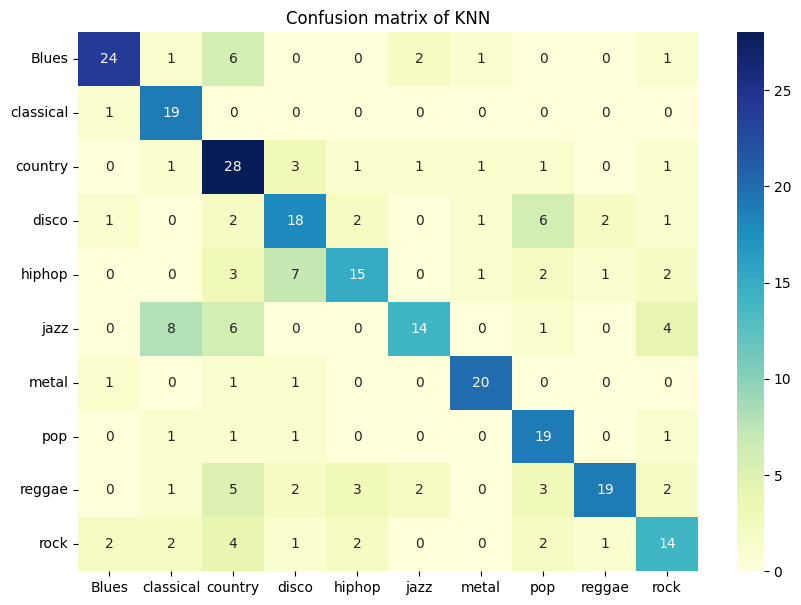

In [ ]:
from sklearn.model_selection import GridSearchCV
# Applying GridSearchCV to find the best k value
grid_params = {
    "n_neighbors": [3,5,7,9,11,13,15,17],
    "weights": ["uniform"],
    "metric": ["euclidean", "manhattan"]
}

grid_knn = GridSearchCV(KNeighborsClassifier(), grid_params, verbose=1,cv=5,n_jobs=-1)

grid_knn.fit(X_train, y_train)
knn_pred = grid_knn.predict(X_test)
print("Train set accuracy: {:.2f}".format(grid_knn.score(X_train, y_train)))
print("Test set accuracy: {:.2f}".format(accuracy_score(y_test, knn_pred)))
print('Best n_neighbors:', grid_knn.best_estimator_.get_params()['n_neighbors'])


#ploting the confusion matrix for KNN
grid_cm = pd.DataFrame(confusion_matrix(y_test, knn_pred), index = ["Blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"],
                  columns = ["Blues", "classical", "country", "disco", "hiphop", "jazz", "metal", "pop", "reggae", "rock"])
plt.figure(figsize = (10,7))
plt.title("Confusion matrix of KNN")
sn.heatmap(grid_cm, annot=True, cmap="YlGnBu")

In [ ]:
df_test = df_capped.sample(n=6)
actual_class_test_data = df_test['label']
actual_class_test_data

,label
250,country
71,blues
94,blues
724,pop
157,classical
584,jazz


In [ ]:
df_test.head()

,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,tempo,flux,contrast,...,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label,class_label
250,50.wav,0.344648,0.022713,1827.093958,2050.585535,3647.252946,0.084825,112.347147,1.206717,22.158479,...,-6.157009,-1.844581,-5.355182,-8.306348,-10.728061,-7.740845,-3.443732,-6.962086,country,2
71,23.wav,0.387910,0.102537,1912.443630,2361.390473,4776.687783,0.058426,123.046875,1.249638,21.420790,...,-5.149289,0.193788,-14.486603,6.864802,-4.444831,-2.986878,-4.821170,5.399324,blues,0
94,3.wav,0.363562,0.175494,1552.637786,1747.382028,3041.089944,0.076301,161.499023,1.639342,22.191794,...,-8.899733,-1.087024,-9.216774,2.453648,-7.721793,-1.816497,-3.434354,-2.231391,blues,0
724,82.wav,0.390401,0.273605,3498.357975,3295.518365,7664.611986,0.136022,129.199219,1.994042,18.442456,...,-1.837747,5.196832,-3.110544,-0.863054,-3.862115,-2.349483,-0.226048,2.220570,pop,7
157,25.wav,0.293035,0.056977,1932.837172,1740.233465,3573.161727,0.117520,135.999178,1.137742,22.346314,...,-3.782006,5.303999,4.108334,6.645054,2.992921,3.541689,-3.361932,-3.678782,classical,1


In [ ]:
df_test.drop(columns=['label'],inplace=True)
df_test = df_test.iloc[:,1:-1]
df_test_transformed = scaler.transform(df_test)
df_test

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:486: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,tempo,flux,contrast,flatness,...,mfcc11,mfcc12,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20
250,0.344648,0.022713,1827.093958,2050.585535,3647.252946,0.084825,112.347147,1.206717,22.158479,0.008392,...,-5.974665,-2.894897,-6.157009,-1.844581,-5.355182,-8.306348,-10.728061,-7.740845,-3.443732,-6.962086
71,0.387910,0.102537,1912.443630,2361.390473,4776.687783,0.058426,123.046875,1.249638,21.420790,0.003205,...,-16.676622,5.823079,-5.149289,0.193788,-14.486603,6.864802,-4.444831,-2.986878,-4.821170,5.399324
94,0.363562,0.175494,1552.637786,1747.382028,3041.089944,0.076301,161.499023,1.639342,22.191794,0.002632,...,-13.115349,5.785763,-8.899733,-1.087024,-9.216774,2.453648,-7.721793,-1.816497,-3.434354,-2.231391
724,0.390401,0.273605,3498.357975,3295.518365,7664.611986,0.136022,129.199219,1.994042,18.442456,0.063573,...,-0.538722,1.751758,-1.837747,5.196832,-3.110544,-0.863054,-3.862115,-2.349483,-0.226048,2.220570
157,0.293035,0.056977,1932.837172,1740.233465,3573.161727,0.117520,135.999178,1.137742,22.346314,0.002468,...,-7.313064,3.840409,-3.782006,5.303999,4.108334,6.645054,2.992921,3.541689,-3.361932,-3.678782
584,0.277247,0.100318,971.547588,1301.652217,1795.922474,0.042575,123.046875,1.140836,20.217566,0.000519,...,-6.069606,-1.336764,-3.151841,-6.473728,-3.300241,2.155403,-2.304969,-7.364892,-5.195212,-2.860356


In [ ]:
genre= dict(zip(df_capped.class_label.unique(),df_capped.label.unique()))

In [ ]:
genre_predictions = model.predict(df_test_transformed)
print('*****************')
print('Actual class:')
print('*****************')
for actual_class in actual_class_test_data.values:
    print(actual_class)

print('\n*****************')
print('predicted class:')
print('*****************')
for predicted_class in genre_predictions:
    print(genre[predicted_class])

*****************
Actual class:
*****************
country
blues
blues
pop
classical
jazz

*****************
predicted class:
*****************
classical
blues
blues
pop
classical
jazz
